__Note__: Due to Github haven't supported interactive plots yet, some of the plots here won't be shown. As an alternative, please open this notebook using NBViewer by clicking [here](https://nbviewer.org/github/darren7753/H8_3/blob/master/PYTN_Assgn_1_3_Darren/PYTN_Assgn_1_3_Darren.ipynb).

# Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium

# Data

Read the CSV file and assign it to a variable called _data_.

In [2]:
data = pd.read_csv("london_crime_by_lsoa.csv")
data.head()

,lsoa_code,borough,major_category,minor_category,value,year,month
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6


Make a copy of the dataset called _df_, so that any changes won't affect the original dataset.

In [3]:
df = data.copy()

Check if there are null values in the dataset.

In [4]:
df.isnull().sum()

lsoa_code         0
borough           0
major_category    0
minor_category    0
value             0
year              0
month             0
dtype: int64

Create a new column called _date_ by combining _year_ and _month_ columns, then convert it to datetime.

In [5]:
date = []
for i,j in zip(df["year"],df["month"]):
    date.append(f"{i} {j}")
df["date"] = date

df["date"] = pd.to_datetime(df["date"])

df.head()

,lsoa_code,borough,major_category,minor_category,value,year,month,date
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11,2016-11-01
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11,2016-11-01
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5,2015-05-01
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3,2016-03-01
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6,2008-06-01


Drop unnecessary columns and set _date_ as index.

In [6]:
df = df.sort_values("date")
df = df.drop(["lsoa_code","year","month"],axis=1)
df = df.set_index("date")
df.head()

,borough,major_category,minor_category,value
date,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3
2008-01-01,Redbridge,Criminal Damage,Criminal Damage To Dwelling,0
2008-01-01,Barnet,Drugs,Drug Trafficking,0
2008-01-01,Hammersmith and Fulham,Violence Against the Person,Common Assault,0
2008-01-01,Barking and Dagenham,Sexual Offences,Other Sexual,0


# Line Plot - What Year had the Most Crimes?

Create a new dataframe called *sum_per_year* that consists number of crimes by year.

In [7]:
sum_per_year = df.groupby(df.index.year).sum()[["value"]]
sum_per_year.head()

,value
date,
2008,738641
2009,717214
2010,715324
2011,724915
2012,737329


Create a line plot to visualize number of crimes by year.

In [8]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=sum_per_year.index,
                         y=sum_per_year["value"],
                         mode="lines+markers",
                         line=dict(color="blue")))
fig.update_layout(title="Number of Crimes from 2008 - 2016",
                  title_x=0.5,
                  xaxis_title="Year",
                  yaxis_title="Number of Crimes")
fig.show()

__Conclusion__: Based on the line plot above, it can be seen that most crimes occured in the year of 2008 with a total of 738641 crimes.

# Area Plot - How were the Crime Trends in 5 Boroughs with the Most Crimes from 2008 - 2016?

Find the top 5 boroughs with the most crimes, which are:
- Westminter
- Lambeth
- Southwark
- Camden
- Newham

In [9]:
top_5 = list(df.groupby("borough").sum()["value"].sort_values(ascending=False).head().index)
top_5

['Westminster', 'Lambeth', 'Southwark', 'Camden', 'Newham']

Slice the dataset, so that it only contains boroughs mentioned above, then sum the number of crimes by every borough and year.

In [10]:
top_5_percentage = df[df["borough"].isin(top_5)][["borough","value"]]
top_5_percentage = top_5_percentage.groupby(["borough",top_5_percentage.index.year]).sum()[["value"]]
top_5_percentage = top_5_percentage.reset_index()
top_5_percentage.head()

,borough,date,value
0,Camden,2008,32010
1,Camden,2009,31612
2,Camden,2010,31804
3,Camden,2011,33956
4,Camden,2012,31472


Calculate the percentage of increase or decrease of crimes for every borough.

In [11]:
percentage = []
for i in top_5_percentage["borough"].unique():
    temp_data = top_5_percentage[top_5_percentage["borough"] == i]
    temp_value = temp_data["value"]
    percentage.append(list(temp_value.pct_change().fillna(0)))
    
percentage = np.ravel(percentage)
top_5_percentage["percentage"] = percentage
top_5_percentage["percentage"] = np.round(top_5_percentage["percentage"]*100,2)
top_5_percentage.head()

,borough,date,value,percentage
0,Camden,2008,32010,0.00
1,Camden,2009,31612,-1.24
2,Camden,2010,31804,0.61
3,Camden,2011,33956,6.77
4,Camden,2012,31472,-7.32


Create an area plot to visualize crime trends in Camden, Lambeth, Newham, Southwark, and Westminster from 2008 - 2016.

In [12]:
fig = go.Figure()
fig = px.area(top_5_percentage,x="date",y="percentage",color="borough",
              labels={"date":"Year","borough":"Borough","percentage":"Percentage (%)","value":"Number of Crimes"},
              hover_data=["value"])
fig.update_layout(title="Crime Trends in Camden, Lambeth, Newham, Southwark, and Westminster from 2008 - 2016",
                  title_x=0.5,
                  xaxis_title="Year",
                  yaxis_title="Percentage (%)",
                  legend=dict(title="Boroughs"))
fig.show()

__Conclusion__: Based on the area plot above, it can be seen that all boroughs had similiar fluctuating trends. The highest drop in crimes occured in 2012 - 2013, especially in Westminster where the number of crimes was down from 59226 to 53852 (9.07%).

# Scatter Plot, Histogram, and Box Plot - Is Number of Crimes Data by Month Normally Distributed?

Create a new dataframe called *value_per_month* that consists number of crimes by month.

In [13]:
value_per_month = df.resample("M").sum()
value_per_month.head()

,value
date,
2008-01-31,65419
2008-02-29,62626
2008-03-31,61343
2008-04-30,59640
2008-05-31,62587


Before creating a Q-Q plot, there are some things that need to be done first, which are:
- Sort the values of *x<sub>(i)</sub>* from smallest to largest
- Calculate *p<sub>(i)</sub>* where $$p_{(i)} = \frac{i - \frac{1}{2}}{n}$$
- Calculate *q<sub>(i)</sub>* where $$P(z ≤ q_{(i)}) = \int_{-\infty}^{q_{(i)}} \frac{1}{\sqrt{2\pi}}e^{\frac{-z^2}{2}}dz$$

In [14]:
from scipy.stats import norm,shapiro

n = np.arange(1,len(value_per_month) + 1)
xn = np.sort(np.array(value_per_month["value"]))

pn = [(i - 1/2)/len(value_per_month) for i in n]
qn = [norm.ppf(i) for i in pn]

z = np.polyfit(qn,xn,1)
p = np.poly1d(z)

Create an scatter plot (Q-Q plot) and use Shapiro-Wilk test to check normality both visually and formally.

In [15]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=qn,y=xn,mode="markers",marker=dict(size=10),line=dict(color="blue"),name="Observed Distribution"))
fig.add_trace(go.Scatter(x=qn,y=p(qn),mode="lines",line=dict(color="red"),name="Expected Distribution"))
fig.update_layout(title="Q-Q Plot",
                  title_x=0.5,
                  xaxis_title=r"$q_{(i)}$",
                  yaxis_title=r"$x_{(i)}$")
fig.show()

sw,prob = shapiro(value_per_month["value"])
print(pd.DataFrame(data=[["Shapiro-Wilk",sw],["Probability",prob]]).rename(columns={0:"",1:""}).to_string(index=False))

                     
Shapiro-Wilk 0.982844
 Probability 0.179010


__Conclusion__: Based on the scatter plot (Q-Q plot) above, it can be seen that the blue plots are around the red line. Also, the probability of Shapiro-Wilk is greather than 0.05, so normality assumption is met both visually and formally.

Create a histogram as an alternative to check normality visually and box plot to show descriptive statistics.

In [16]:
from scipy.stats import skew,kurtosis

fig = go.Figure()
fig = px.histogram(value_per_month,x="value",nbins=30,labels={"value":"Number of Crimes"},marginal="box")
fig.update_layout(title="Distribution of Number of Crimes by Month",
                  title_x=0.5,
                  xaxis_title=r"Number of Crimes",
                  yaxis_title=r"Frequency")
fig.show()

print(pd.DataFrame(data=[["Observations",len(value_per_month)],
                         ["Mean",np.mean(value_per_month["value"])],
                         ["Median",np.median(value_per_month["value"])],
                         ["Maximum",np.max(value_per_month["value"])],
                         ["Minimum",np.min(value_per_month["value"])],
                         ["Std. Dev.",np.std(value_per_month["value"],ddof=1)],
                         ["Skewness",skew(value_per_month["value"],axis=0,bias=False)],
                         ["Kurtosis",kurtosis(value_per_month["value"],axis=0,fisher=True,bias=False)],
                         ["Shapiro-Wilk",sw],
                         ["Probability",prob]]).rename(columns={0:"",1:""}).to_string(index=False))

                         
Observations   108.000000
        Mean 59701.462963
      Median 59717.500000
     Maximum 67537.000000
     Minimum 51222.000000
   Std. Dev.  3211.096841
    Skewness    -0.303271
    Kurtosis    -0.307667
Shapiro-Wilk     0.982844
 Probability     0.179010


__Conclusion__: Based on the histogram above, it can be seen that its shape is approximately bell-shaped and symmetric about the mean, so normality assumption is met visually. In addition, box plot also shows descriptive statistics to give a clearer picture what the dataset might look like.

# Bar Plot - What Borough had the Most Crimes and What was the Most Common Crime in that Borough?

Create a new dataframe called *borough_major* that consists number of crimes by borough and major category.

In [17]:
borough_major = df.groupby(["borough","major_category"]).sum()[["value"]]
borough_major = borough_major.reset_index()
borough_major.head()

,borough,major_category,value
0,Barking and Dagenham,Burglary,18103
1,Barking and Dagenham,Criminal Damage,18888
2,Barking and Dagenham,Drugs,9188
3,Barking and Dagenham,Fraud or Forgery,205
4,Barking and Dagenham,Other Notifiable Offences,2819


Create a bar plot to visualize number of crimes by borough and major category.

In [18]:
fig = px.bar(borough_major,
             x="borough",
             y="value",
             color="major_category",
             labels={"major_category":"Major Category","borough":"Borough","value":"Number of Crimes"},
             category_orders={"borough":df.groupby("borough").sum()[["value"]].sort_values("value",ascending=False).index})
fig.update_layout(title="Number of Crimes by Borough and Major Category",
                  title_x=0.5,
                  xaxis_title="Boroughs",
                  yaxis_title="Number of Crimes",
                  legend=dict(title="Major Categories"))
fig.show()

__Conclusion__: Based on the bar plot above, it can be seen that Westminster had the most crimes, more than 400k crimes, with theft and handling being the most common among others.

# Pie Chart - What Crimes that Have the Highest Percentage on Major and Minor Categories?

Create a new dataframe called *major* that consists number of crimes by major category, then calculate the percentage of every category.

In [19]:
major = df.groupby("major_category").sum()[["value"]]
major["percentage"] = major["value"] / df["value"].sum() * 100
major = major.sort_values("percentage",ascending=False)
major = major.reset_index()
major.head()

,major_category,value,percentage
0,Theft and Handling,2661861,41.283513
1,Violence Against the Person,1558081,24.164694
2,Burglary,754293,11.698531
3,Criminal Damage,630938,9.785386
4,Drugs,470765,7.301220


Create a new dataframe called *minor* by repeating the step above on minor categories.

In [20]:
minor = df.groupby("minor_category").sum()[["value"]]
minor["percentage"] = minor["value"] / df["value"].sum() * 100
minor = minor.sort_values("percentage",ascending=False)
minor = minor.reset_index()
minor.head()

,minor_category,value,percentage
0,Other Theft,980085,15.200400
1,Theft From Motor Vehicle,569956,8.839600
2,Burglary in a Dwelling,491282,7.619424
3,Harassment,458124,7.105167
4,Assault with Injury,451001,6.994695


Create pie charts to visualize percentage of crimes by major and minor categories.

In [21]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=1,cols=2,specs=[[{"type":"pie"}, {"type":"pie"}]],
                    subplot_titles=("Major Categories","Minor Categories"))

fig.add_trace(go.Pie(labels=major["major_category"],
                     values=major["value"],
                     name="Major Category",
                     pull=[0.1],
                     showlegend=False),1, 1)
fig.add_trace(go.Pie(labels=minor["minor_category"],
                     values=minor["value"],
                     name="Minor Category",
                     pull=[0.1],
                     showlegend=False),1, 2)

fig.update_traces(hoverinfo="label+percent+name")
fig.update_layout(title="Percentage of Crimes by Major and Minor Categories",title_x=0.5)
fig.show()

__Conclusion__: Based on the pie charts above, it can be seen that for major categories, theft and handling have the highest percentage with 41.3%, followed by violence against the person with 24.2% and burglary with 11.7%. While for minor categories, other theft has the highest percentage with 15.2%, followed by theft from motor vehicle with 8.84% and burglary in a dwelling with 7.62%.

# Word Cloud - What are the Most Frequently Occurring Words in Minor Categories?

Create a word cloud to find what are the most frequently occuring words

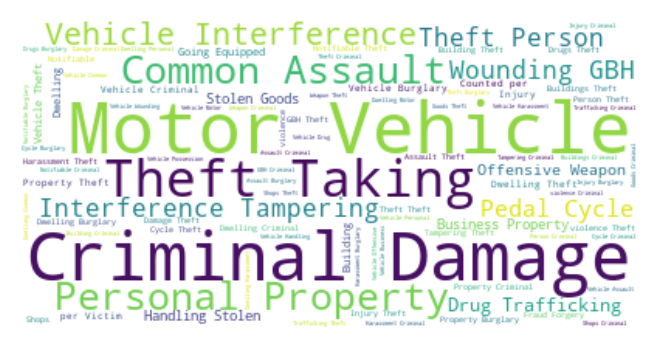

In [22]:
from wordcloud import WordCloud,STOPWORDS

stopwords = set(STOPWORDS)

plt.figure(figsize=(4,4),dpi=200)
crimes_wordcloud = WordCloud(background_color="white",
                             stopwords=stopwords).generate(" ".join(df["minor_category"]))
plt.imshow(crimes_wordcloud,interpolation="bilinear")
plt.axis("off")
plt.show()

__Conclusion__: Based on the word cloud above, it can be seen that minor categories are dominated by words such as motor vehicle and criminal damage.

# Folium and Choropleth Maps - How were Crimes in London in General?

Sort the dataset by *borough* column and assign it to a variable called *borough_order*.

In [23]:
borough_order = df.sort_values("borough")
borough_order.head()

,borough,major_category,minor_category,value
date,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3
2009-08-01,Barking and Dagenham,Criminal Damage,Criminal Damage To Dwelling,1
2012-02-01,Barking and Dagenham,Theft and Handling,Motor Vehicle Interference & Tampering,0
2013-11-01,Barking and Dagenham,Theft and Handling,Theft From Shops,0
2013-11-01,Barking and Dagenham,Criminal Damage,Criminal Damage To Dwelling,2


Find the latitude and longitude for every borough.

In [24]:
from geopy.geocoders import Nominatim

geolocator = Nominatim(user_agent="MyApp")

latitude,longitude = ([] for i in range(2))
for i in borough_order["borough"].unique():
    location = geolocator.geocode(i,timeout=None)
    latitude.append(location.latitude)
    longitude.append(location.longitude)

Split *borough_order* dataset by borough to make things easier.

In [25]:
temp_borough = []
for i in borough_order["borough"].unique():
    temp_borough.append(borough_order[borough_order["borough"] == i])

Insert latitude and longitute to each splitted dataset.

In [26]:
for i,j,k in zip(temp_borough,latitude,longitude):
    i.insert(4,"latitude",j)
    i.insert(5,"longitude",k)

Combine all splitted datasets and resort by _date_ index.

In [27]:
borough_coordinate = pd.concat(temp_borough)
borough_coordinate = borough_coordinate.sort_index()
borough_coordinate.head()

,borough,major_category,minor_category,value,latitude,longitude
date,,,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3,51.554091,0.150489
2008-01-01,Richmond upon Thames,Theft and Handling,Handling Stolen Goods,0,51.440553,-0.307639
2008-01-01,Brent,Drugs,Possession Of Drugs,0,51.563996,-0.275906
2008-01-01,Richmond upon Thames,Robbery,Personal Property,0,51.440553,-0.307639
2008-01-01,Brent,Violence Against the Person,Harassment,0,51.563996,-0.275906


To reduce computational cost, 5000 samples will be taken from the dataset.

In [28]:
borough_coordinate_sample = borough_coordinate.sample(n=5000,random_state=42,axis=0)
borough_coordinate_sample.head()

,borough,major_category,minor_category,value,latitude,longitude
date,,,,,,
2016-01-01,Tower Hamlets,Burglary,Burglary in a Dwelling,0,51.128863,1.298669
2008-09-01,Croydon,Criminal Damage,Other Criminal Damage,1,51.371305,-0.101957
2008-05-01,Camden,Theft and Handling,Theft From Motor Vehicle,1,39.944840,-75.119891
2010-02-01,Newham,Violence Against the Person,Harassment,0,51.530016,0.029309
2013-12-01,Greenwich,Other Notifiable Offences,Going Equipped,0,51.482084,-0.004542


Find the latitude and longitute of London.

In [29]:
london = geolocator.geocode("London",timeout=None)
london.latitude,london.longitude

(51.5073219, -0.1276474)

Create a map to show number of crimes and their categories.

In [30]:
from folium import plugins

london_map = folium.Map(location=[london.latitude,london.longitude],zoom_start=10)

crimes = plugins.MarkerCluster().add_to(london_map)

for i,j,k in zip(borough_coordinate_sample["latitude"],
                 borough_coordinate_sample["longitude"],
                 borough_coordinate_sample["major_category"]):
    folium.Marker(location=[i,j],
                  icon=None,
                  popup=k).add_to(crimes)

london_map

__Conclusion__: Based on the map above, it can be seen that crimes in most places were somewhere between 100 to 200, except for one in the middle which had more than 900 crimes. 

Download GeoJSON file that defines boroughs in London.

In [31]:
from urllib.request import urlopen
import json
with urlopen("https://skgrange.github.io/www/data/london_boroughs.json") as response:
    london_boroughs = json.load(response)

Get IDs for each borough from the GeoJSON file.

In [32]:
boroughs_id = {}
for i in london_boroughs["features"]:
    i["id"] = i["properties"]["id"]
    boroughs_id[i["properties"]["name"]] = i["id"]

Add and match those IDs to relevant boroughs in the dataframe.

In [33]:
borough_crimes = df.groupby("borough").sum()[["value"]].reset_index()
borough_crimes["id"] = borough_crimes["borough"].apply(lambda x: boroughs_id[x])
borough_crimes.head()

,borough,value,id
0,Barking and Dagenham,149447,32
1,Barnet,212191,10
2,Bexley,114136,15
3,Brent,227551,9
4,Bromley,184349,3


Create a choropleth map to visualize number of crimes in London from 2008 - 2016.

In [34]:
fig = go.Figure()
fig = px.choropleth_mapbox(borough_crimes,
                           geojson=london_boroughs,
                           locations="id",
                           color="value",
                           color_continuous_scale="AgsunSet",
                           labels={"id":"ID","value":"Number of Crimes"},
                           hover_name="borough",
                           mapbox_style="carto-positron",
                           center={"lat":london.latitude - 0.015,"lon":london.longitude},
                           zoom=8.7)
fig.update_layout(margin={"r":0,"l":0,"b":0},title="Number of Crimes in London from 2008 - 2016",title_x=0.5)
fig.show()

__Conclusion__: Based on the map above, it can be seen that most boroughs had ±200K crimes, except for City of London which had the least crimes at 780 and Westminster which had the most crimes at 455K.